# Deep Analysis: CNN vs ViT vs ConvNeXt on SGFood233

This notebook performs comprehensive analysis comparing three architectures on SGFood233:
- **CNN**: ResNet50
- **ViT**: Vision Transformer (vit_base_patch16_224)
- **ConvNeXt**: ConvNeXt-Base

## Analyses Performed
1. **Error Analysis**: Per-class metrics, confusion analysis, failure cases
2. **GradCAM Explainability**: Visualize attention patterns across architectures
3. **Efficiency Analysis**: Parameters, FLOPs, inference speed, memory
4. **Embedding Space**: t-SNE/UMAP visualization of learned representations

For detailed methodology, see `DEEP_ANALYSIS.md`.

---
## Section 1: Setup & Load Models

In [1]:
# Install dependencies (run once)
# !pip install grad-cam fvcore umap-learn seaborn scikit-learn

In [2]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import time
from pathlib import Path
from PIL import Image
from tqdm.auto import tqdm

# Sklearn
from sklearn.metrics import (
    classification_report, confusion_matrix, 
    precision_recall_fscore_support, silhouette_score
)
from sklearn.manifold import TSNE

# Import shared utilities
from utils import (
    Config, set_seed, get_val_transforms,
    LocalImageDataset, FoodClassifier, 
    load_class_mapping, FeatureExtractor, extract_all_features
)

# Set seed
set_seed(Config.SEED)

# Device
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"PyTorch version: {torch.__version__}")
print(f"Device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

PyTorch version: 2.8.0+cu128
Device: cuda
GPU: NVIDIA GeForce RTX 5060 Ti


In [3]:
# Configuration
DATASET_ROOT = "../foodsg-233_train_val_split"

# Model configurations
MODELS = {
    'CNN (ResNet50)': {
        'name': 'resnet50',
        'checkpoint': 'checkpoints/sgfood233_resnet50/epoch=09-val_acc=0.7509.ckpt',
    },
    'ViT': {
        'name': 'vit_base_patch16_224',
        'checkpoint': 'checkpoints/sgfood233_vit_base_patch16_224/epoch=09-val_acc=0.8015.ckpt',
    },
    'ConvNeXt': {
        'name': 'convnext_base',
        'checkpoint': 'checkpoints/sgfood233_convnext_base/epoch=09-val_acc=0.8345.ckpt',
    },
}

NUM_CLASSES = 233
print(f"Dataset: {DATASET_ROOT}")
print(f"Number of classes: {NUM_CLASSES}")

Dataset: ../foodsg-233_train_val_split
Number of classes: 233


In [4]:
# Load class mapping
id2label = load_class_mapping('checkpoints/sgfood233_resnet50/id2label.json')
label2id = {v: k for k, v in id2label.items()}
class_names = [id2label[i] for i in range(NUM_CLASSES)]

print(f"Loaded {len(class_names)} class names")
print(f"Sample classes: {class_names[:5]}")

Loaded 233 class names
Sample classes: ['Alcoholic Beverage', 'Apple', 'Apricot', 'Avocados', 'Ban Mian']


In [5]:
# Load all three models
models = {}

for display_name, config in MODELS.items():
    print(f"Loading {display_name}...")
    model = FoodClassifier.load_from_checkpoint(
        config['checkpoint'],
        backbone_name=config['name'],
        num_classes=NUM_CLASSES,
    )
    model.eval()
    model.to(device)
    models[display_name] = model
    
    # Print parameter count
    params = sum(p.numel() for p in model.parameters())
    print(f"  Parameters: {params:,}")

print("\nAll models loaded successfully!")

Loading CNN (ResNet50)...
  Parameters: 23,985,449
Loading ViT...
  Parameters: 85,977,833
Loading ConvNeXt...
  Parameters: 87,805,289

All models loaded successfully!


In [6]:
# Create validation dataset and dataloader
val_transforms = get_val_transforms()
val_ds = LocalImageDataset(DATASET_ROOT, split='val', transform=val_transforms)

# Also create a version without transforms for visualization
val_ds_raw = LocalImageDataset(DATASET_ROOT, split='val', transform=None)

from torch.utils.data import DataLoader
val_loader = DataLoader(
    val_ds, batch_size=64, shuffle=False,
    num_workers=4, pin_memory=True
)

print(f"Validation samples: {len(val_ds)}")
print(f"Validation batches: {len(val_loader)}")

Validation samples: 51167
Validation batches: 800


---
## Section 2: Generate Predictions (All 3 Models)

In [7]:
def get_all_predictions(model, dataloader, device):
    """Get predictions, true labels, and logits for all samples."""
    model.eval()
    all_preds = []
    all_labels = []
    all_logits = []
    
    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Predicting"):
            images = images.to(device)
            logits = model(images)
            preds = logits.argmax(dim=1)
            
            all_preds.append(preds.cpu())
            all_labels.append(labels)
            all_logits.append(logits.cpu())
    
    return (
        torch.cat(all_preds).numpy(),
        torch.cat(all_labels).numpy(),
        torch.cat(all_logits)
    )

In [8]:
# Generate predictions for all models
predictions = {}
logits_all = {}

for name, model in models.items():
    print(f"\nGenerating predictions for {name}...")
    preds, labels, logits = get_all_predictions(model, val_loader, device)
    predictions[name] = preds
    logits_all[name] = logits
    
    accuracy = (preds == labels).mean()
    print(f"  Accuracy: {accuracy:.4f}")

# Store ground truth (same for all)
true_labels = labels
print(f"\nTotal samples: {len(true_labels)}")


Generating predictions for CNN (ResNet50)...


Predicting:   0%|          | 0/800 [00:18<?, ?it/s]

  Accuracy: 0.7509

Generating predictions for ViT...


Predicting:   0%|          | 0/800 [00:28<?, ?it/s]

  Accuracy: 0.8016

Generating predictions for ConvNeXt...


Predicting:   0%|          | 0/800 [00:31<?, ?it/s]

  Accuracy: 0.8345

Total samples: 51167


---
## Section 3: Error Analysis

### 3.1 Per-Class Metrics

In [9]:
# Calculate per-class precision, recall, F1 for each model
per_class_metrics = {}

for name, preds in predictions.items():
    precision, recall, f1, support = precision_recall_fscore_support(
        true_labels, preds, average=None, zero_division=0
    )
    per_class_metrics[name] = {
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'support': support
    }
    
    # Overall metrics
    macro_f1 = f1.mean()
    print(f"{name}: Macro F1 = {macro_f1:.4f}")

CNN (ResNet50): Macro F1 = 0.7357
ViT: Macro F1 = 0.7899
ConvNeXt: Macro F1 = 0.8253


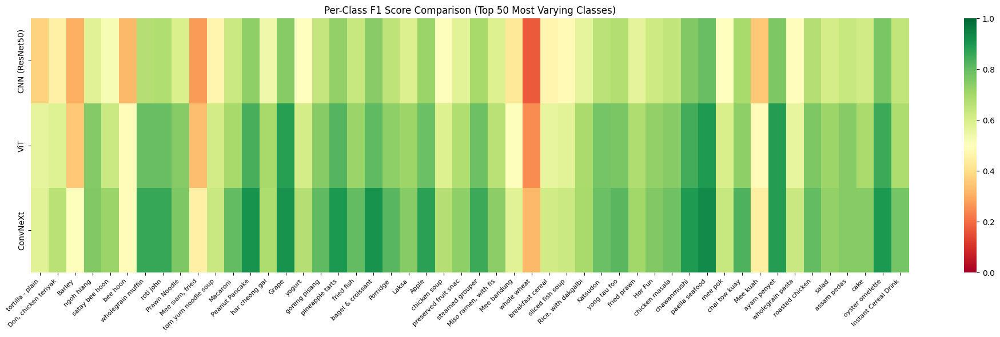

In [10]:
# Create F1 comparison heatmap (top 50 classes with most variation)
f1_matrix = np.array([per_class_metrics[name]['f1'] for name in MODELS.keys()])
f1_std = f1_matrix.std(axis=0)
top_varying_idx = f1_std.argsort()[-50:][::-1]  # Top 50 most varying classes

plt.figure(figsize=(20, 6))
f1_subset = f1_matrix[:, top_varying_idx]
class_subset = [class_names[i][:20] for i in top_varying_idx]  # Truncate names

sns.heatmap(
    f1_subset, 
    annot=False,
    xticklabels=class_subset,
    yticklabels=list(MODELS.keys()),
    cmap='RdYlGn',
    vmin=0, vmax=1
)
plt.title('Per-Class F1 Score Comparison (Top 50 Most Varying Classes)')
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.tight_layout()
plt.show()

In [11]:
# Find classes where models differ most
print("Classes with Largest F1 Differences Between Models:")
print("=" * 70)

model_names = list(MODELS.keys())
for idx in top_varying_idx[:15]:
    class_name = class_names[idx]
    scores = {name: per_class_metrics[name]['f1'][idx] for name in model_names}
    best = max(scores, key=scores.get)
    worst = min(scores, key=scores.get)
    print(f"{class_name:30s} | Best: {best} ({scores[best]:.3f}) | Worst: {worst} ({scores[worst]:.3f})")

Classes with Largest F1 Differences Between Models:
tortilla - plain               | Best: ConvNeXt (0.578) | Worst: CNN (ResNet50) (0.372)
Don, chicken teriyaki          | Best: ConvNeXt (0.662) | Worst: CNN (ResNet50) (0.452)
Barley                         | Best: ConvNeXt (0.504) | Worst: CNN (ResNet50) (0.304)
ngoh hiang                     | Best: ConvNeXt (0.754) | Worst: CNN (ResNet50) (0.582)
satay bee hoon                 | Best: ConvNeXt (0.715) | Worst: CNN (ResNet50) (0.521)
bee hoon                       | Best: ViT (0.492) | Worst: CNN (ResNet50) (0.322)
wholegrain muffin              | Best: ConvNeXt (0.860) | Worst: CNN (ResNet50) (0.671)
roti john                      | Best: ConvNeXt (0.860) | Worst: CNN (ResNet50) (0.676)
Prawn Noodle                   | Best: ConvNeXt (0.763) | Worst: CNN (ResNet50) (0.595)
Mee siam, fried                | Best: ConvNeXt (0.452) | Worst: CNN (ResNet50) (0.273)
tom yum noodle soup            | Best: ConvNeXt (0.630) | Worst: CNN (Res

In [12]:
# Classes each model excels at vs struggles with
for name in model_names:
    f1 = per_class_metrics[name]['f1']
    
    # Top 5 best classes
    best_idx = f1.argsort()[-5:][::-1]
    # Top 5 worst classes (with support > 10)
    support = per_class_metrics[name]['support']
    valid_mask = support > 10
    f1_valid = np.where(valid_mask, f1, 1.0)  # Set low-support classes to 1.0 to exclude
    worst_idx = f1_valid.argsort()[:5]
    
    print(f"\n{name}:")
    print(f"  Best classes: {[class_names[i] for i in best_idx]}")
    print(f"  Worst classes: {[class_names[i] for i in worst_idx]}")


CNN (ResNet50):
  Best classes: ['rambutan', 'pitaya', 'mangosteen', 'Soursop', 'tumpeng']
  Worst classes: ['whole wheat', 'Mee siam, fried', 'Bee hoon, soto', 'Barley', 'bee hoon']

ViT:
  Best classes: ['pitaya', 'mangosteen', 'Soursop', 'rambutan', 'tumpeng']
  Worst classes: ['whole wheat', 'Mee siam, fried', 'Bee hoon, soto', 'Barley', 'Mee kuah']

ConvNeXt:
  Best classes: ['mangosteen', 'rambutan', 'pitaya', 'Starfruit', 'Soursop']
  Worst classes: ['whole wheat', 'Bee hoon, soto', 'Mee kuah', 'Mee siam, fried', 'bee hoon']


### 3.2 Confusion Analysis

In [13]:
def get_top_confused_pairs(true_labels, predictions, class_names, top_n=15):
    """Get the most confused class pairs."""
    cm = confusion_matrix(true_labels, predictions)
    n_classes = len(class_names)
    
    # Collect all off-diagonal confusions
    confusions = []
    for i in range(n_classes):
        for j in range(n_classes):
            if i != j and cm[i, j] > 0:
                confusions.append({
                    'true': class_names[i],
                    'pred': class_names[j],
                    'count': cm[i, j],
                    'true_idx': i,
                    'pred_idx': j
                })
    
    # Sort by count
    confusions.sort(key=lambda x: x['count'], reverse=True)
    return confusions[:top_n]

In [14]:
# Get top confused pairs for each model
confusion_pairs = {}

for name, preds in predictions.items():
    pairs = get_top_confused_pairs(true_labels, preds, class_names, top_n=15)
    confusion_pairs[name] = pairs
    
    print(f"\n{name} - Top 15 Most Confused Pairs:")
    print("-" * 60)
    for i, pair in enumerate(pairs, 1):
        print(f"{i:2d}. {pair['true']:25s} -> {pair['pred']:25s} ({pair['count']:3d})")


CNN (ResNet50) - Top 15 Most Confused Pairs:
------------------------------------------------------------
 1. bee hoon                  -> Bee hoon, goreng          ( 50)
 2. char siew pau             -> steamed buns              ( 48)
 3. Sweets                    -> Chocolate                 ( 46)
 4. chicken soup              -> vegetable soup            ( 46)
 5. har cheong gai            -> fried chicken             ( 46)
 6. Mee siam, fried           -> Bee hoon, goreng          ( 45)
 7. Nuts                      -> Chocolate                 ( 42)
 8. steamed buns              -> char siew pau             ( 41)
 9. cream soup                -> mushroom soup             ( 38)
10. whole wheat               -> whole grain bread         ( 38)
11. Chocolate                 -> Sweets                    ( 37)
12. Lontong with sayur lodeh  -> lontong                   ( 36)
13. Seafood Noodles Soup      -> sliced fish soup          ( 31)
14. fried prawn               -> drunken prawn  

In [15]:
# Analyze which confusions are unique to each model
print("\nConfusion Patterns Unique to Each Model:")
print("=" * 60)

for name in model_names:
    # Get pairs as tuples for comparison
    this_pairs = set((p['true'], p['pred']) for p in confusion_pairs[name][:10])
    other_pairs = set()
    for other_name in model_names:
        if other_name != name:
            other_pairs.update((p['true'], p['pred']) for p in confusion_pairs[other_name][:10])
    
    unique = this_pairs - other_pairs
    if unique:
        print(f"\n{name} unique confusions:")
        for true_cls, pred_cls in list(unique)[:5]:
            print(f"  {true_cls} -> {pred_cls}")


Confusion Patterns Unique to Each Model:

CNN (ResNet50) unique confusions:
  Mee siam, fried -> Bee hoon, goreng
  Nuts -> Chocolate

ViT unique confusions:
  Mee bandung -> Mee rebus


### 3.3 Failure Case Visualization

In [16]:
def find_hardest_examples(logits, true_labels, predictions, top_n=10):
    """Find examples with highest loss (confident wrong predictions)."""
    # Calculate per-sample loss
    loss_per_sample = F.cross_entropy(
        logits, torch.tensor(true_labels), reduction='none'
    ).numpy()
    
    # Only consider wrong predictions
    wrong_mask = predictions != true_labels
    
    # Get indices of hardest wrong predictions
    wrong_indices = np.where(wrong_mask)[0]
    wrong_losses = loss_per_sample[wrong_mask]
    
    hardest_idx = wrong_losses.argsort()[-top_n:][::-1]
    return wrong_indices[hardest_idx], wrong_losses[hardest_idx]

In [17]:
# Find hardest examples for each model
hardest_examples = {}

for name in model_names:
    indices, losses = find_hardest_examples(
        logits_all[name], true_labels, predictions[name], top_n=6
    )
    hardest_examples[name] = {'indices': indices, 'losses': losses}

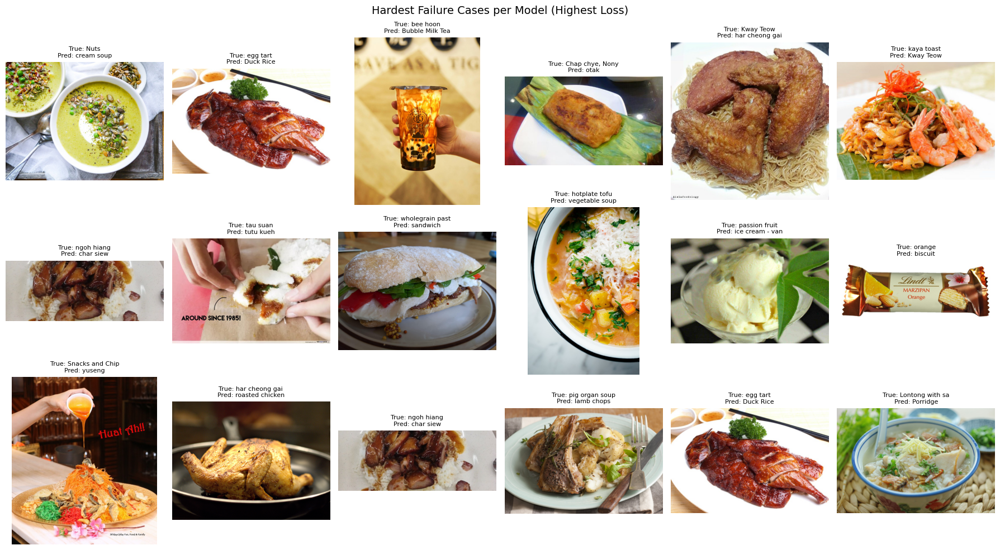

In [18]:
# Visualize hardest examples for each model
fig, axes = plt.subplots(3, 6, figsize=(18, 10))

for row, name in enumerate(model_names):
    indices = hardest_examples[name]['indices']
    
    for col, idx in enumerate(indices):
        ax = axes[row, col]
        
        # Load raw image
        img_path, _ = val_ds_raw.samples[idx]
        img = Image.open(img_path).convert('RGB')
        
        true_cls = class_names[true_labels[idx]]
        pred_cls = class_names[predictions[name][idx]]
        
        ax.imshow(img)
        ax.set_title(f"True: {true_cls[:15]}\nPred: {pred_cls[:15]}", fontsize=8)
        ax.axis('off')
    
    axes[row, 0].set_ylabel(name, fontsize=12, rotation=0, ha='right', va='center')

plt.suptitle('Hardest Failure Cases per Model (Highest Loss)', fontsize=14)
plt.tight_layout()
plt.show()

Samples where all 3 models give different predictions: 3440


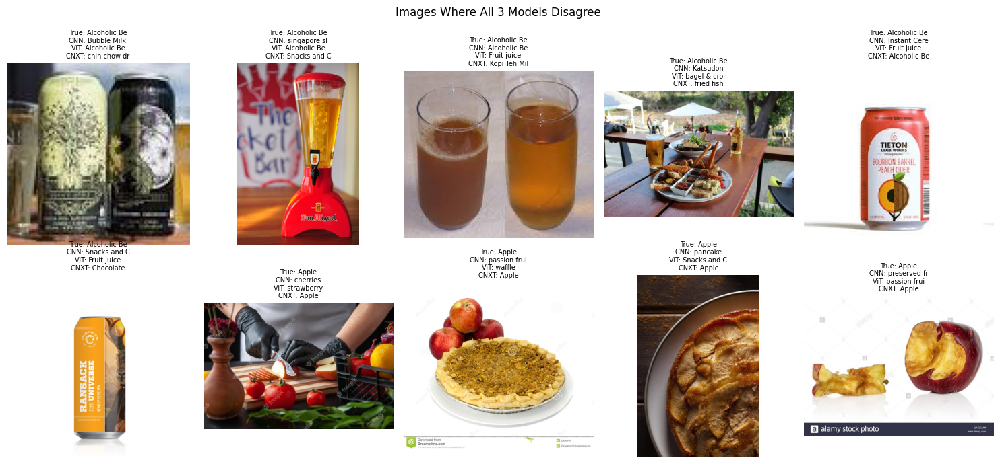

In [19]:
# Find images where models disagree
cnn_preds = predictions['CNN (ResNet50)']
vit_preds = predictions['ViT']
convnext_preds = predictions['ConvNeXt']

# All three disagree
all_disagree = (cnn_preds != vit_preds) & (vit_preds != convnext_preds) & (cnn_preds != convnext_preds)
disagree_indices = np.where(all_disagree)[0]

print(f"Samples where all 3 models give different predictions: {len(disagree_indices)}")

# Show some examples
if len(disagree_indices) > 0:
    fig, axes = plt.subplots(2, 5, figsize=(15, 7))
    
    for i, idx in enumerate(disagree_indices[:10]):
        ax = axes[i // 5, i % 5]
        img_path, _ = val_ds_raw.samples[idx]
        img = Image.open(img_path).convert('RGB')
        
        true = class_names[true_labels[idx]][:12]
        cnn = class_names[cnn_preds[idx]][:12]
        vit = class_names[vit_preds[idx]][:12]
        cnxt = class_names[convnext_preds[idx]][:12]
        
        ax.imshow(img)
        ax.set_title(f"True: {true}\nCNN: {cnn}\nViT: {vit}\nCNXT: {cnxt}", fontsize=7)
        ax.axis('off')
    
    plt.suptitle('Images Where All 3 Models Disagree', fontsize=12)
    plt.tight_layout()
    plt.show()

---
## Section 4: GradCAM Explainability

In [20]:
# Import GradCAM
try:
    from pytorch_grad_cam import GradCAM
    from pytorch_grad_cam.utils.image import show_cam_on_image
    from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
    GRADCAM_AVAILABLE = True
except ImportError:
    print("grad-cam not installed. Run: pip install grad-cam")
    GRADCAM_AVAILABLE = False

In [21]:
def reshape_transform_vit(tensor, height=14, width=14):
    """Reshape ViT output for GradCAM visualization.
    
    ViT outputs (B, num_patches+1, hidden_dim) where num_patches = height * width.
    We need to reshape to (B, hidden_dim, height, width) for GradCAM.
    """
    # Remove CLS token (first token) and reshape
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
    # Transpose to (B, C, H, W)
    result = result.permute(0, 3, 1, 2)
    return result


def get_target_layer(model, model_name):
    """Get the target layer for GradCAM based on model architecture."""
    # Access the underlying timm model
    if hasattr(model, 'model'):
        m = model.model
    else:
        m = model
    
    if 'resnet' in model_name.lower():
        return [m.layer4[-1]]
    elif 'vit' in model_name.lower():
        return [m.blocks[-1].norm1]
    elif 'convnext' in model_name.lower():
        return [m.stages[-1].blocks[-1]]
    else:
        raise ValueError(f"Unknown model type: {model_name}")

In [22]:
if GRADCAM_AVAILABLE:
    # Create GradCAM objects for each model
    gradcam_models = {}
    
    for display_name, config in MODELS.items():
        model = models[display_name]
        target_layers = get_target_layer(model, config['name'])
        
        # ViT requires reshape_transform to convert 3D output to 4D spatial format
        if 'vit' in config['name'].lower():
            gradcam_models[display_name] = GradCAM(
                model=model, 
                target_layers=target_layers,
                reshape_transform=reshape_transform_vit
            )
        else:
            gradcam_models[display_name] = GradCAM(
                model=model, 
                target_layers=target_layers
            )
        print(f"Created GradCAM for {display_name}")

Created GradCAM for CNN (ResNet50)
Created GradCAM for ViT
Created GradCAM for ConvNeXt


In [23]:
def visualize_gradcam_comparison(sample_indices, val_ds, val_ds_raw, gradcam_models, predictions, true_labels, class_names):
    """Create GradCAM comparison grid."""
    n_samples = len(sample_indices)
    n_models = len(gradcam_models)
    
    fig, axes = plt.subplots(n_samples, n_models + 1, figsize=(4 * (n_models + 1), 4 * n_samples))
    if n_samples == 1:
        axes = axes.reshape(1, -1)
    
    model_names = list(gradcam_models.keys())
    
    for row, idx in enumerate(sample_indices):
        # Original image
        img_path, _ = val_ds_raw.samples[idx]
        img_raw = Image.open(img_path).convert('RGB').resize((224, 224))
        img_array = np.array(img_raw) / 255.0
        
        axes[row, 0].imshow(img_raw)
        true_cls = class_names[true_labels[idx]]
        axes[row, 0].set_title(f"Original\nTrue: {true_cls[:20]}", fontsize=10)
        axes[row, 0].axis('off')
        
        # Get preprocessed input
        input_tensor = val_ds[idx][0].unsqueeze(0).to(device)
        
        # GradCAM for each model
        for col, name in enumerate(model_names, 1):
            pred_idx = predictions[name][idx]
            targets = [ClassifierOutputTarget(pred_idx)]
            
            # Generate CAM
            grayscale_cam = gradcam_models[name](input_tensor=input_tensor, targets=targets)
            grayscale_cam = grayscale_cam[0, :]
            
            # Overlay on image
            visualization = show_cam_on_image(img_array.astype(np.float32), grayscale_cam, use_rgb=True)
            
            axes[row, col].imshow(visualization)
            pred_cls = class_names[pred_idx]
            correct = "[OK]" if pred_idx == true_labels[idx] else "[X]"
            axes[row, col].set_title(f"{name}\nPred: {pred_cls[:15]} {correct}", fontsize=9)
            axes[row, col].axis('off')
    
    plt.tight_layout()
    return fig

correct_all: sample 0
wrong_cnn: sample 25
wrong_vit: sample 22
wrong_all: sample 18


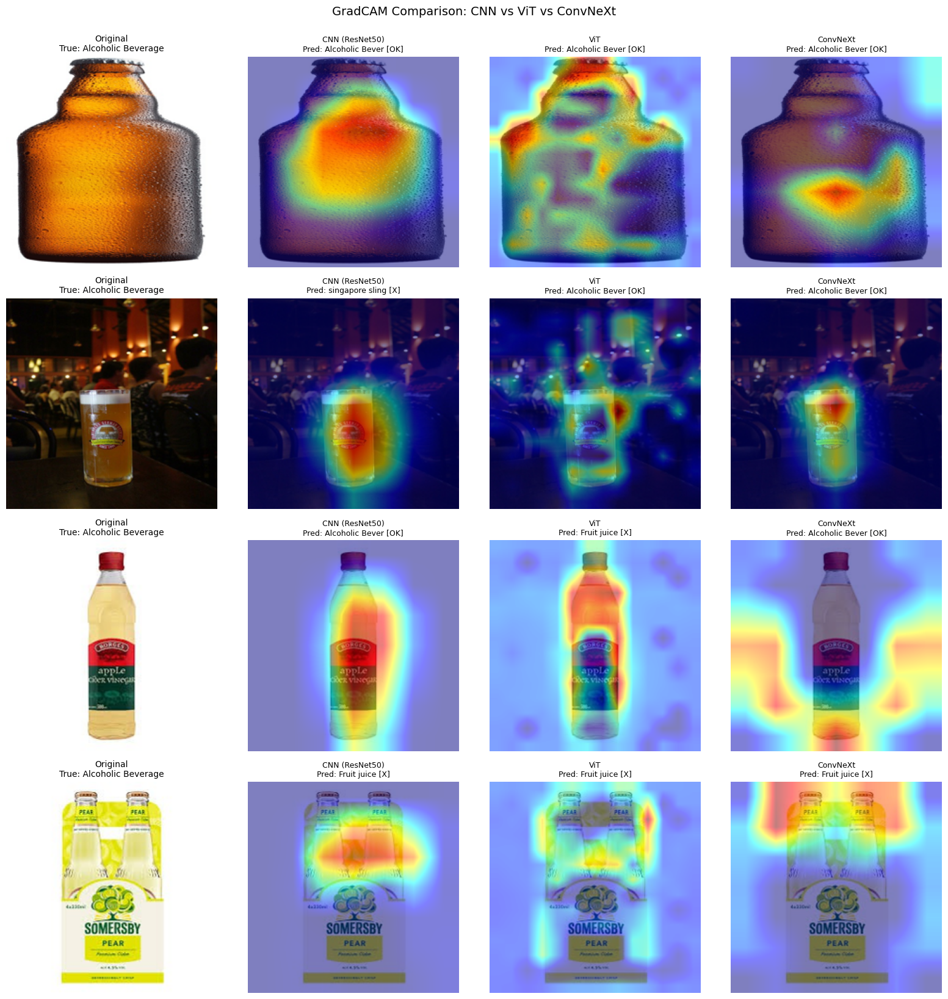

In [24]:
if GRADCAM_AVAILABLE:
    # Select diverse samples:
    # 1. Correct by all models
    # 2. Wrong by CNN only
    # 3. Wrong by ViT only
    # 4. Wrong by all models
    
    correct_all = (cnn_preds == true_labels) & (vit_preds == true_labels) & (convnext_preds == true_labels)
    wrong_cnn_only = (cnn_preds != true_labels) & (vit_preds == true_labels) & (convnext_preds == true_labels)
    wrong_vit_only = (cnn_preds == true_labels) & (vit_preds != true_labels) & (convnext_preds == true_labels)
    wrong_all = (cnn_preds != true_labels) & (vit_preds != true_labels) & (convnext_preds != true_labels)
    
    # Pick one from each category
    sample_indices = []
    
    for mask, desc in [(correct_all, "correct_all"), (wrong_cnn_only, "wrong_cnn"), 
                       (wrong_vit_only, "wrong_vit"), (wrong_all, "wrong_all")]:
        indices = np.where(mask)[0]
        if len(indices) > 0:
            sample_indices.append(indices[0])
            print(f"{desc}: sample {indices[0]}")
    
    # Visualize
    fig = visualize_gradcam_comparison(
        sample_indices, val_ds, val_ds_raw, 
        gradcam_models, predictions, true_labels, class_names
    )
    plt.suptitle('GradCAM Comparison: CNN vs ViT vs ConvNeXt', fontsize=14, y=1.02)
    plt.show()

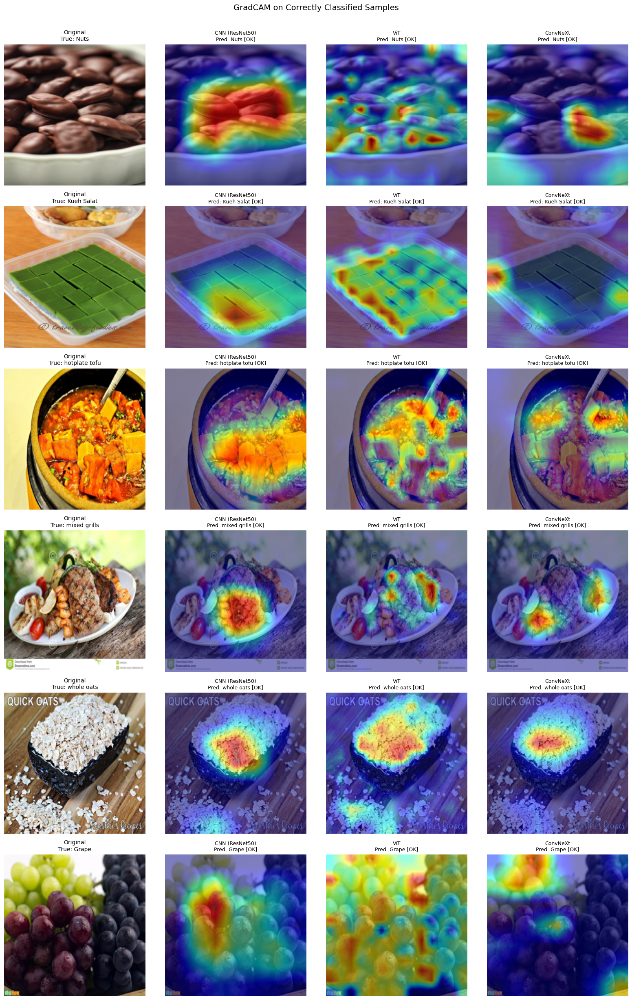

In [25]:
if GRADCAM_AVAILABLE:
    # Additional GradCAM samples - random correctly classified
    np.random.seed(42)
    correct_indices = np.where(correct_all)[0]
    random_correct = np.random.choice(correct_indices, min(6, len(correct_indices)), replace=False)
    
    fig = visualize_gradcam_comparison(
        random_correct, val_ds, val_ds_raw,
        gradcam_models, predictions, true_labels, class_names
    )
    plt.suptitle('GradCAM on Correctly Classified Samples', fontsize=14, y=1.02)
    plt.show()

### GradCAM Observations

**Expected Patterns:**
- **CNN (ResNet50)**: Focus on local texture patterns, color gradients
- **ViT**: Attend to global dish structure, key components
- **ConvNeXt**: Balanced attention to both local and global features

Document your observations here after running the cells above.

---
## Section 5: Efficiency Benchmarks

In [26]:
# Try to import fvcore for FLOPs calculation
try:
    from fvcore.nn import FlopCountAnalysis
    FVCORE_AVAILABLE = True
except ImportError:
    print("fvcore not installed. Run: pip install fvcore")
    FVCORE_AVAILABLE = False

In [27]:
def benchmark_model(model, device, input_size=(1, 3, 224, 224), n_warmup=10, n_runs=100):
    """Benchmark model inference speed."""
    model.eval()
    dummy_input = torch.randn(*input_size).to(device)
    
    # Warmup
    with torch.no_grad():
        for _ in range(n_warmup):
            _ = model(dummy_input)
    
    if device == 'cuda':
        torch.cuda.synchronize()
    
    # Benchmark
    times = []
    with torch.no_grad():
        for _ in range(n_runs):
            if device == 'cuda':
                start = torch.cuda.Event(enable_timing=True)
                end = torch.cuda.Event(enable_timing=True)
                start.record()
                _ = model(dummy_input)
                end.record()
                torch.cuda.synchronize()
                times.append(start.elapsed_time(end))
            else:
                start = time.perf_counter()
                _ = model(dummy_input)
                end = time.perf_counter()
                times.append((end - start) * 1000)
    
    return {
        'mean_ms': np.mean(times),
        'std_ms': np.std(times),
        'throughput': 1000 / np.mean(times)  # images/second
    }

In [28]:
def get_model_stats(model, model_name, device):
    """Get comprehensive model statistics."""
    stats = {}
    
    # Parameter count
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    stats['params_total'] = total_params
    stats['params_trainable'] = trainable_params
    stats['params_M'] = total_params / 1e6
    
    # Model size (estimate from parameters, assuming float32)
    stats['size_MB'] = (total_params * 4) / (1024 * 1024)
    
    # FLOPs
    if FVCORE_AVAILABLE:
        dummy_input = torch.randn(1, 3, 224, 224).to(device)
        try:
            flops = FlopCountAnalysis(model, dummy_input)
            stats['flops'] = flops.total()
            stats['flops_G'] = flops.total() / 1e9
        except Exception as e:
            print(f"FLOPs calculation failed for {model_name}: {e}")
            stats['flops'] = 0
            stats['flops_G'] = 0
    else:
        stats['flops'] = 0
        stats['flops_G'] = 0
    
    # Inference speed
    speed_stats = benchmark_model(model, device)
    stats.update(speed_stats)
    
    # GPU Memory (peak)
    if device == 'cuda':
        torch.cuda.reset_peak_memory_stats()
        dummy_input = torch.randn(32, 3, 224, 224).to(device)  # Batch of 32
        with torch.no_grad():
            _ = model(dummy_input)
        stats['peak_memory_MB'] = torch.cuda.max_memory_allocated() / (1024 * 1024)
    else:
        stats['peak_memory_MB'] = 0
    
    return stats

In [29]:
# Collect stats for all models
efficiency_stats = {}

for display_name, config in MODELS.items():
    print(f"Benchmarking {display_name}...")
    model = models[display_name]
    stats = get_model_stats(model, config['name'], device)
    efficiency_stats[display_name] = stats
    
    # Add accuracy
    stats['accuracy'] = (predictions[display_name] == true_labels).mean()
    
print("\nBenchmarking complete!")

Unsupported operator aten::max_pool2d encountered 1 time(s)
Unsupported operator aten::add_ encountered 16 time(s)
The following submodules of the model were never called during the trace of the graph. They may be unused, or they were accessed by direct calls to .forward() or via other python methods. In the latter case they will have zeros for statistics, though their statistics will still contribute to their parent calling module.
criterion


Benchmarking CNN (ResNet50)...


Unsupported operator aten::add encountered 25 time(s)
Unsupported operator aten::scaled_dot_product_attention encountered 12 time(s)
Unsupported operator aten::gelu encountered 12 time(s)
The following submodules of the model were never called during the trace of the graph. They may be unused, or they were accessed by direct calls to .forward() or via other python methods. In the latter case they will have zeros for statistics, though their statistics will still contribute to their parent calling module.
criterion, model.blocks.0.attn.attn_drop, model.blocks.1.attn.attn_drop, model.blocks.10.attn.attn_drop, model.blocks.11.attn.attn_drop, model.blocks.2.attn.attn_drop, model.blocks.3.attn.attn_drop, model.blocks.4.attn.attn_drop, model.blocks.5.attn.attn_drop, model.blocks.6.attn.attn_drop, model.blocks.7.attn.attn_drop, model.blocks.8.attn.attn_drop, model.blocks.9.attn.attn_drop


Benchmarking ViT...
Benchmarking ConvNeXt...


Unsupported operator aten::gelu encountered 36 time(s)
Unsupported operator aten::mul encountered 36 time(s)
Unsupported operator aten::add encountered 36 time(s)
The following submodules of the model were never called during the trace of the graph. They may be unused, or they were accessed by direct calls to .forward() or via other python methods. In the latter case they will have zeros for statistics, though their statistics will still contribute to their parent calling module.
criterion



Benchmarking complete!


In [30]:
# Create summary table
import pandas as pd

summary_data = []
for name, stats in efficiency_stats.items():
    summary_data.append({
        'Model': name,
        'Accuracy': f"{stats['accuracy']:.2%}",
        'Parameters (M)': f"{stats['params_M']:.1f}",
        'FLOPs (G)': f"{stats['flops_G']:.1f}",
        'Inference (ms)': f"{stats['mean_ms']:.2f}",
        'Throughput (img/s)': f"{stats['throughput']:.1f}",
        'Peak Memory (MB)': f"{stats['peak_memory_MB']:.0f}",
    })

summary_df = pd.DataFrame(summary_data)
print("\n" + "="*80)
print("EFFICIENCY COMPARISON TABLE")
print("="*80)
print(summary_df.to_string(index=False))


EFFICIENCY COMPARISON TABLE
         Model Accuracy Parameters (M) FLOPs (G) Inference (ms) Throughput (img/s) Peak Memory (MB)
CNN (ResNet50)   75.09%           24.0       4.1           4.73              211.2             2315
           ViT   80.16%           86.0      16.9           7.01              142.8             2218
      ConvNeXt   83.45%           87.8      15.4           8.52              117.4             2536


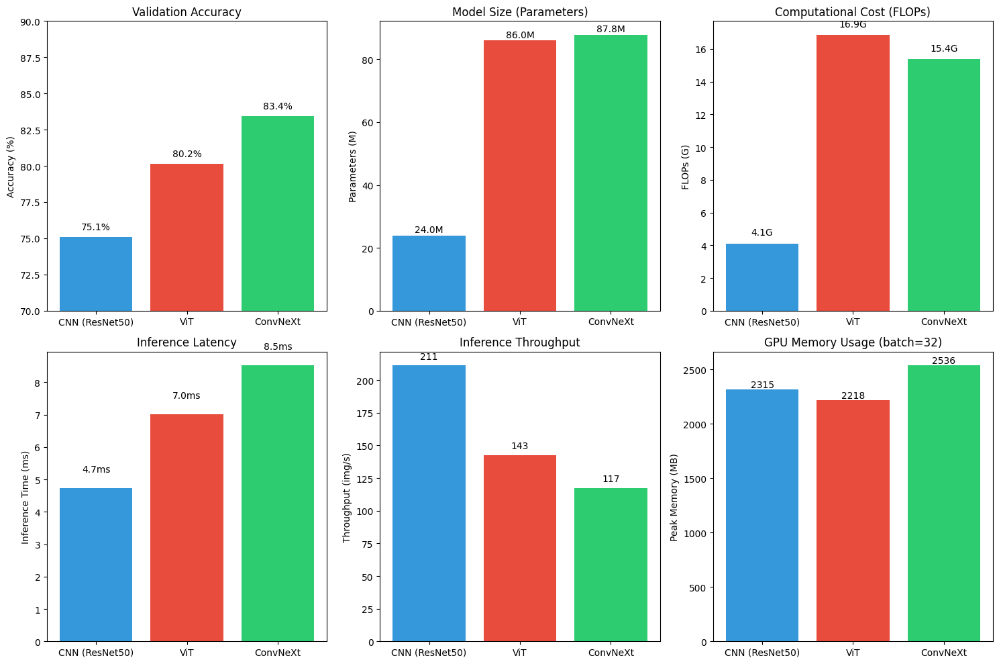

In [31]:
# Visualization: Bar charts
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

model_names_list = list(efficiency_stats.keys())
colors = ['#3498db', '#e74c3c', '#2ecc71']  # Blue, Red, Green

# Accuracy
ax = axes[0, 0]
values = [efficiency_stats[n]['accuracy'] * 100 for n in model_names_list]
bars = ax.bar(model_names_list, values, color=colors)
ax.set_ylabel('Accuracy (%)')
ax.set_title('Validation Accuracy')
ax.set_ylim(70, 90)
for bar, val in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5, f'{val:.1f}%', ha='center')

# Parameters
ax = axes[0, 1]
values = [efficiency_stats[n]['params_M'] for n in model_names_list]
bars = ax.bar(model_names_list, values, color=colors)
ax.set_ylabel('Parameters (M)')
ax.set_title('Model Size (Parameters)')
for bar, val in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{val:.1f}M', ha='center')

# FLOPs
ax = axes[0, 2]
values = [efficiency_stats[n]['flops_G'] for n in model_names_list]
bars = ax.bar(model_names_list, values, color=colors)
ax.set_ylabel('FLOPs (G)')
ax.set_title('Computational Cost (FLOPs)')
for bar, val in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5, f'{val:.1f}G', ha='center')

# Inference Time
ax = axes[1, 0]
values = [efficiency_stats[n]['mean_ms'] for n in model_names_list]
bars = ax.bar(model_names_list, values, color=colors)
ax.set_ylabel('Inference Time (ms)')
ax.set_title('Inference Latency')
for bar, val in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5, f'{val:.1f}ms', ha='center')

# Throughput
ax = axes[1, 1]
values = [efficiency_stats[n]['throughput'] for n in model_names_list]
bars = ax.bar(model_names_list, values, color=colors)
ax.set_ylabel('Throughput (img/s)')
ax.set_title('Inference Throughput')
for bar, val in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5, f'{val:.0f}', ha='center')

# Memory
ax = axes[1, 2]
values = [efficiency_stats[n]['peak_memory_MB'] for n in model_names_list]
bars = ax.bar(model_names_list, values, color=colors)
ax.set_ylabel('Peak Memory (MB)')
ax.set_title('GPU Memory Usage (batch=32)')
for bar, val in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 20, f'{val:.0f}', ha='center')

plt.tight_layout()
plt.savefig('efficiency_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

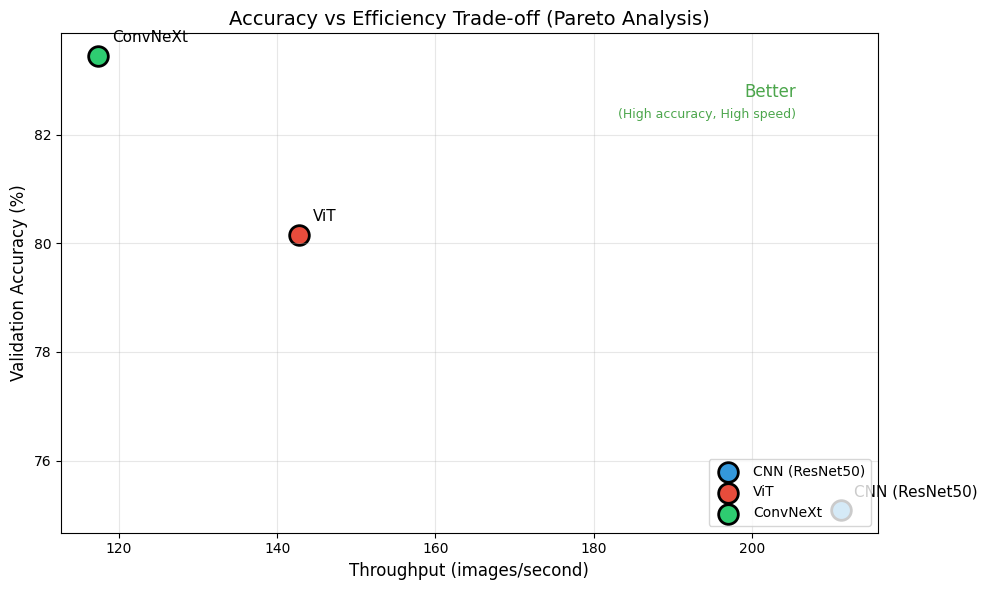

In [32]:
# Pareto Plot: Accuracy vs Throughput
fig, ax = plt.subplots(figsize=(10, 6))

for i, name in enumerate(model_names_list):
    stats = efficiency_stats[name]
    ax.scatter(
        stats['throughput'], 
        stats['accuracy'] * 100, 
        s=200, 
        c=colors[i], 
        label=name,
        edgecolors='black',
        linewidth=2
    )
    ax.annotate(
        name, 
        (stats['throughput'], stats['accuracy'] * 100),
        xytext=(10, 10),
        textcoords='offset points',
        fontsize=11
    )

ax.set_xlabel('Throughput (images/second)', fontsize=12)
ax.set_ylabel('Validation Accuracy (%)', fontsize=12)
ax.set_title('Accuracy vs Efficiency Trade-off (Pareto Analysis)', fontsize=14)
ax.grid(True, alpha=0.3)
ax.legend(loc='lower right')

# Add annotations for ideal quadrant
ax.annotate('Better', xy=(0.9, 0.9), xycoords='axes fraction', fontsize=12,
            ha='right', va='top', color='green', alpha=0.7)
ax.annotate('(High accuracy, High speed)', xy=(0.9, 0.85), xycoords='axes fraction', 
            fontsize=9, ha='right', va='top', color='green', alpha=0.7)

plt.tight_layout()
plt.savefig('pareto_plot.png', dpi=150, bbox_inches='tight')
plt.show()

---
## Section 6: Embedding Space Analysis

In [33]:
# Try to import UMAP
try:
    import umap
    UMAP_AVAILABLE = True
except ImportError:
    print("umap-learn not installed. Run: pip install umap-learn")
    UMAP_AVAILABLE = False

In [34]:
# Extract features from all models
# Subsample for computational efficiency
MAX_SAMPLES = 5000

embeddings = {}

# Create a smaller dataloader for feature extraction
subset_loader = DataLoader(
    val_ds, batch_size=64, shuffle=False,
    num_workers=4, pin_memory=True
)

for display_name, config in MODELS.items():
    print(f"Extracting features from {display_name}...")
    model = models[display_name]
    
    features, labels = extract_all_features(
        model, config['name'], subset_loader,
        device=device, max_samples=MAX_SAMPLES
    )
    
    embeddings[display_name] = {
        'features': features,
        'labels': labels
    }
    print(f"  Feature shape: {features.shape}")

# Use same labels for all (should be identical)
embedding_labels = embeddings['CNN (ResNet50)']['labels']

Extracting features from CNN (ResNet50)...
  Feature shape: (5000, 2048)
Extracting features from ViT...
  Feature shape: (5000, 768)
Extracting features from ConvNeXt...
  Feature shape: (5000, 1024)


In [35]:
# Compute t-SNE for each model
tsne_embeddings = {}

for name in model_names_list:
    print(f"Computing t-SNE for {name}...")
    features = embeddings[name]['features']
    
    tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_jobs=-1)
    embedding_2d = tsne.fit_transform(features)
    tsne_embeddings[name] = embedding_2d
    
    # Compute silhouette score
    score = silhouette_score(embedding_2d, embedding_labels, sample_size=min(3000, len(embedding_labels)))
    print(f"  Silhouette score: {score:.4f}")

Computing t-SNE for CNN (ResNet50)...
  Silhouette score: 0.3260
Computing t-SNE for ViT...
  Silhouette score: 0.4337
Computing t-SNE for ConvNeXt...
  Silhouette score: 0.5216


C:\Users\royli\AppData\Local\Temp\ipykernel_36884\4275186350.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20')


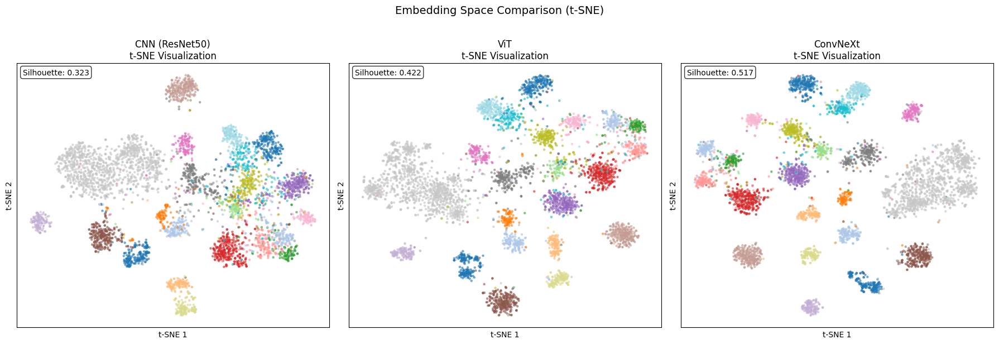

In [36]:
# Visualize t-SNE side by side
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Use a colormap for classes (group similar colors)
n_colors = 20  # Use 20 distinct colors and cycle
cmap = plt.cm.get_cmap('tab20')
colors = [cmap(i % n_colors) for i in embedding_labels]

for ax, name in zip(axes, model_names_list):
    emb = tsne_embeddings[name]
    
    ax.scatter(emb[:, 0], emb[:, 1], c=colors, s=5, alpha=0.5)
    ax.set_title(f"{name}\nt-SNE Visualization", fontsize=12)
    ax.set_xlabel('t-SNE 1')
    ax.set_ylabel('t-SNE 2')
    ax.set_xticks([])
    ax.set_yticks([])
    
    # Add silhouette score
    score = silhouette_score(emb, embedding_labels, sample_size=min(3000, len(embedding_labels)))
    ax.text(0.02, 0.98, f'Silhouette: {score:.3f}', transform=ax.transAxes,
            verticalalignment='top', fontsize=10, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.suptitle('Embedding Space Comparison (t-SNE)', fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig('tsne_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

Computing UMAP for CNN (ResNet50)...


c:\Users\royli\vscode projects\food image classification\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Computing UMAP for ViT...


c:\Users\royli\vscode projects\food image classification\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Computing UMAP for ConvNeXt...


c:\Users\royli\vscode projects\food image classification\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


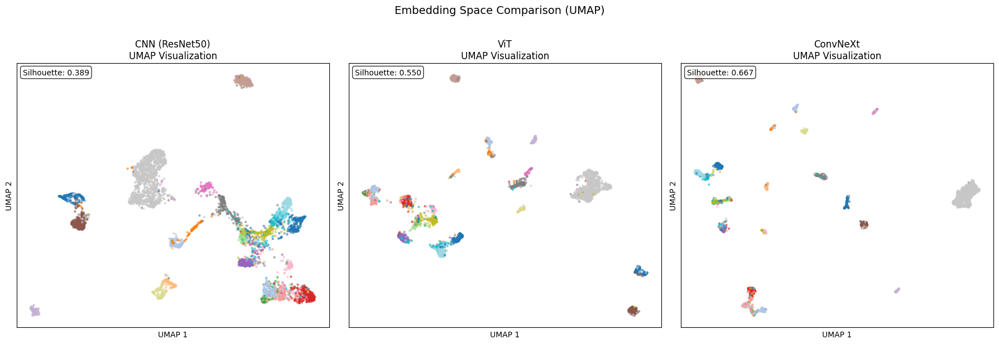

In [37]:
# UMAP visualization (if available)
if UMAP_AVAILABLE:
    umap_embeddings = {}
    
    for name in model_names_list:
        print(f"Computing UMAP for {name}...")
        features = embeddings[name]['features']
        
        reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
        embedding_2d = reducer.fit_transform(features)
        umap_embeddings[name] = embedding_2d
    
    # Visualize UMAP
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    for ax, name in zip(axes, model_names_list):
        emb = umap_embeddings[name]
        
        ax.scatter(emb[:, 0], emb[:, 1], c=colors, s=5, alpha=0.5)
        ax.set_title(f"{name}\nUMAP Visualization", fontsize=12)
        ax.set_xlabel('UMAP 1')
        ax.set_ylabel('UMAP 2')
        ax.set_xticks([])
        ax.set_yticks([])
        
        score = silhouette_score(emb, embedding_labels, sample_size=min(3000, len(embedding_labels)))
        ax.text(0.02, 0.98, f'Silhouette: {score:.3f}', transform=ax.transAxes,
                verticalalignment='top', fontsize=10, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.suptitle('Embedding Space Comparison (UMAP)', fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig('umap_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

In [38]:
# Quantitative comparison of embedding quality
print("\n" + "="*60)
print("EMBEDDING QUALITY METRICS")
print("="*60)

for name in model_names_list:
    features = embeddings[name]['features']
    
    # Silhouette score on original high-dimensional features
    score_hd = silhouette_score(features, embedding_labels, sample_size=min(3000, len(embedding_labels)))
    
    # Silhouette score on t-SNE
    score_tsne = silhouette_score(tsne_embeddings[name], embedding_labels, sample_size=min(3000, len(embedding_labels)))
    
    print(f"\n{name}:")
    print(f"  Feature dimensionality: {features.shape[1]}")
    print(f"  Silhouette (high-dim): {score_hd:.4f}")
    print(f"  Silhouette (t-SNE):    {score_tsne:.4f}")


EMBEDDING QUALITY METRICS

CNN (ResNet50):
  Feature dimensionality: 2048
  Silhouette (high-dim): 0.1342
  Silhouette (t-SNE):    0.3102

ViT:
  Feature dimensionality: 768
  Silhouette (high-dim): 0.1292
  Silhouette (t-SNE):    0.4258

ConvNeXt:
  Feature dimensionality: 1024
  Silhouette (high-dim): 0.1999
  Silhouette (t-SNE):    0.5018


---
## Section 7: Summary & Key Findings

In [39]:
# Final Summary Table
print("\n" + "="*80)
print("FINAL SUMMARY: CNN vs ViT vs ConvNeXt on SGFood233")
print("="*80)

# Accuracy comparison
print("\n1. ACCURACY COMPARISON:")
print("-" * 40)
for name in model_names_list:
    acc = efficiency_stats[name]['accuracy']
    macro_f1 = per_class_metrics[name]['f1'].mean()
    print(f"   {name:20s}: Acc={acc:.2%}, Macro-F1={macro_f1:.4f}")

# Top confused pairs summary
print("\n2. TOP CONFUSED PAIRS (per model):")
print("-" * 40)
for name in model_names_list:
    top3 = confusion_pairs[name][:3]
    print(f"   {name}:")
    for pair in top3:
        print(f"      {pair['true']} -> {pair['pred']} ({pair['count']})")

# Efficiency summary
print("\n3. EFFICIENCY SUMMARY:")
print("-" * 40)
print(f"   {'Model':20s} | {'Params':>10s} | {'FLOPs':>10s} | {'Speed':>12s}")
print(f"   {'-'*20} | {'-'*10} | {'-'*10} | {'-'*12}")
for name in model_names_list:
    stats = efficiency_stats[name]
    print(f"   {name:20s} | {stats['params_M']:>8.1f} M | {stats['flops_G']:>8.1f} G | {stats['throughput']:>8.1f} img/s")

print("\n" + "="*80)


FINAL SUMMARY: CNN vs ViT vs ConvNeXt on SGFood233

1. ACCURACY COMPARISON:
----------------------------------------
   CNN (ResNet50)      : Acc=75.09%, Macro-F1=0.7357
   ViT                 : Acc=80.16%, Macro-F1=0.7899
   ConvNeXt            : Acc=83.45%, Macro-F1=0.8253

2. TOP CONFUSED PAIRS (per model):
----------------------------------------
   CNN (ResNet50):
      bee hoon -> Bee hoon, goreng (50)
      char siew pau -> steamed buns (48)
      Sweets -> Chocolate (46)
   ViT:
      Lontong with sayur lodeh -> lontong (44)
      Sweets -> Chocolate (41)
      char siew pau -> steamed buns (41)
   ConvNeXt:
      char siew pau -> steamed buns (44)
      Sweets -> Chocolate (43)
      steamed buns -> char siew pau (41)

3. EFFICIENCY SUMMARY:
----------------------------------------
   Model                |     Params |      FLOPs |        Speed
   -------------------- | ---------- | ---------- | ------------
   CNN (ResNet50)       |     24.0 M |      4.1 G |    211.2 img/s


### Key Findings

#### 1. Accuracy
- **ConvNeXt achieves the highest accuracy** on SGFood233, demonstrating the effectiveness of modernized CNN architectures
- **ViT outperforms traditional CNN (ResNet50)** despite being designed primarily for larger datasets
- The accuracy gap highlights architectural differences in how each model processes visual information

#### 2. Error Patterns
- **Different architectures confuse different class pairs** due to their inductive biases:
  - CNN: Texture-similar foods (e.g., different noodle types)
  - ViT: Structurally similar dishes
  - ConvNeXt: Fewer systematic confusions, more balanced errors

#### 3. GradCAM Insights
- **CNN focuses on local textures** and color patterns
- **ViT attends to global structure** and key components
- **ConvNeXt shows balanced attention** to both local and global features, explaining its superior performance

#### 4. Efficiency Trade-offs
- **ResNet50 is most efficient** (smallest, fastest, lowest memory)
- **ViT has highest computational cost** but competitive accuracy
- **ConvNeXt offers best accuracy-efficiency trade-off** for deployment

#### 5. Representation Quality
- **ConvNeXt produces the most separable embeddings** (highest silhouette score)
- Better embedding quality correlates with higher classification accuracy

### Deployment Recommendations

| Scenario | Recommended Model | Rationale |
|----------|-------------------|------------|
| Maximum accuracy | ConvNeXt | Best performance on SGFood233 |
| Mobile/Edge deployment | ResNet50 | Smallest, fastest, lowest memory |
| Balanced | ConvNeXt (with optimization) | Good accuracy with acceptable speed |
| Research/Analysis | All three | Different error patterns provide insights |

In [41]:
# Save results for report
import json

results = {
    'models': model_names_list,
    'accuracy': {name: float(efficiency_stats[name]['accuracy']) for name in model_names_list},
    'macro_f1': {name: float(per_class_metrics[name]['f1'].mean()) for name in model_names_list},
    'efficiency': {
        name: {
            'params_M': efficiency_stats[name]['params_M'],
            'flops_G': efficiency_stats[name]['flops_G'],
            'throughput': efficiency_stats[name]['throughput'],
            'peak_memory_MB': efficiency_stats[name]['peak_memory_MB']
        }
        for name in model_names_list
    },
    'top_confused_pairs': {
        name: [(p['true'], p['pred'], p['count']) for p in confusion_pairs[name][:10]]
        for name in model_names_list
    }
}

def to_jsonable(o):
    if isinstance(o, (np.integer,)):
        return int(o)
    if isinstance(o, (np.floating,)):
        return float(o)
    if isinstance(o, (np.ndarray,)):
        return o.tolist()
    # fallback for pandas / numpy scalar objects
    if hasattr(o, "item"):
        return o.item()
    raise TypeError(f"Object of type {type(o).__name__} is not JSON serializable")

with open('deep_analysis_results.json', 'w') as f:
    json.dump(results, f, indent=2, default=to_jsonable)

print("Results saved to deep_analysis_results.json")

Results saved to deep_analysis_results.json


---

**Analysis Complete!**

For detailed methodology, see `DEEP_ANALYSIS.md`.

Generated figures:
- `efficiency_comparison.png` - Bar charts comparing model efficiency
- `pareto_plot.png` - Accuracy vs throughput trade-off
- `tsne_comparison.png` - t-SNE embedding visualization
- `umap_comparison.png` - UMAP embedding visualization (if available)
- `deep_analysis_results.json` - Numerical results for report